# 안개 발생 진단 분류 모델 데이터셋 EDA

## 1. 데이터 설명
- 컬럼

    - `Year` : 년도
    - `Month` : 월
    - `Day` : 일
    - `Time` : 시간 (0 ~ 23)
    - `Minute` : 분 (10분 단위)
    - `STN_ID` : 지점 번호
    - `WS10(deg)` : 10분 평균 풍향, 단위: deg
    - `WS10(m/s)` : 10분 평균 풍속, 단위: m/s
    - `TA` : 1분 평균 기온 10분 주기, 단위: C
    - `RE` : 강수 유무 (0:무강수, 1:강수)
    - `HM` : 1분 평균 상대 습도 10분 주기, 단위: %
    - `sun10` : 1분 일사량 10분단위 합계, 단위: MJ
    - `TS` : 1분 평균 지면온도 10분 주기, 단위: C
    - `VIS1` : 1분 평균 시정 10분 주기, 단위: C (VIS1 변수는 시정 구간을 알 수 있는 변수로 검증 데이터에서는 제외)
    - `class` : 시정 구간

- 시정 계급 기준 (비고: 안개의 기준)

    - `1` : 0 < 시정 < 200
    - `2` : 200 <= 시정 < 500
    - `3` : 500 <= 시정 < 1000
    - `4` : 1000 <= 시정


## 2. 데이터 불러오기

In [1]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
from matplotlib import rcParams

import os
import pickle
from sklearn.model_selection import train_test_split

import warnings
warnings.filterwarnings(action='ignore')

# pd.set_option("float_format", "{:.4f}".format)
pd.set_option("display.max_columns", None)

In [2]:
plt.rc('font', family='NanumBarunGothic')
plt.rcParams['axes.unicode_minus'] = False

### 2-1 로컬 디렉토리 경로

In [3]:
# 작업 디렉토리 변경 (로컬 디렉토리에서 작업시 실행)

def get_local_path(train_dataset_name, test_dataset_name):

    # 작업 디렉토리 origin_dir에 선언
    origin_dir = os.getcwd()

    # ".." : 상위 디렉토리로 이동
    os.chdir("..")

    # 상위 디렉토리에 fog_data가 없다면 fog_data 폴더 생성
    # (이미 폴더 있어도 exist_ok=True면 넘어감)
    os.makedirs("fog_data", exist_ok=True)

    # train/test 데이터셋 경로 잡아준다
    train_path = os.path.join(os.getcwd(), "fog_data", train_dataset_name)
    test_path = os.path.join(os.getcwd(), "fog_data", test_dataset_name)

    # 운영체제가 윈도우일 경우, "\\"를 "/"로 바꿔줘야 한다
    if os.name == "nt":
        train_path = train_path.replace("\\", "/")
        test_path = test_path.replace("\\", "/")

    # origin_dir로 경로 다시 변경 (초기화)
    os.chdir(origin_dir)

    return train_path, test_path

In [4]:
train_path, test_path = get_local_path("fog_train.csv", "fog_test.csv")

### 2-2. colab 디렉토리 경로 (colab 작업시)

In [5]:
# # 구글 드라이브 파일 접근
# from google.colab import drive
# drive.mount('/content/drive')

In [6]:
# # colab 파일 경로 생성 함수
# # colab에서 작업시 주석 풀고 실행

# def get_colab_path(train_dataset_name, test_dataset_name):

#     fog_folder = "drive/MyDrive/weather_bigdata/fog_data"
#     os.makedirs(fog_folder, exist_ok=True)

#     # train/test 데이터셋 경로 잡아준다
#     train_path = os.path.join(os.getcwd(), fog_folder, train_dataset_name)
#     test_path = os.path.join(os.getcwd(), fog_folder, test_dataset_name)

#     return train_path, test_path

In [7]:
# train_path, test_path = get_colab_path("fog_train.csv", "fog_test.csv")

In [8]:
train_df = pd.read_csv(train_path, index_col=0).rename(columns=lambda x: x.split('.')[1]).reset_index(drop=True)
test_df = pd.read_csv(test_path, index_col=0).rename(columns=lambda x: x.split('.')[1]).reset_index(drop=True)

## 3. Preprocessing

In [9]:
# train, test 데이터셋에서 -99, -99.9 포함한 컬럼 동일하기 때문에 같이 변수로 선언
train_cols_99 = train_df.columns[train_df.isin([-99]).any()].tolist()
train_cols_99_9 = train_df.columns[train_df.isin([-99.9]).any()].tolist()

test_cols_99 = test_df.columns[test_df.isin([-99]).any()].tolist()
test_cols_99_9 = test_df.columns[test_df.isin([-99.9]).any()].tolist()

In [10]:
print("Train 데이터셋 -99인 값 포함 컬럼 :", train_cols_99)
print("Train 데이터셋 -99.9인 값 포함 컬럼 :", train_cols_99_9, "\n")
print("Test 데이터셋 -99인 값 포함 컬럼 :", test_cols_99)
print("Test 데이터셋 -99.9인 값 포함 컬럼 :", test_cols_99_9)

Train 데이터셋 -99인 값 포함 컬럼 : ['vis1', 'class']
Train 데이터셋 -99.9인 값 포함 컬럼 : ['ws10_deg', 'ws10_ms', 'ta', 're', 'hm', 'sun10', 'ts'] 

Test 데이터셋 -99인 값 포함 컬럼 : ['class']
Test 데이터셋 -99.9인 값 포함 컬럼 : ['ws10_deg', 'ws10_ms', 'ta', 're', 'hm', 'sun10', 'ts']


### 3-1. 데이터셋 분리 (Train / Validtion)

In [11]:
# train / validation 분리에 앞서, target 변수의 결측치를 미리 제거
def drop_nan_in_target(df, col):
    df_copy = df.copy()
    # df_copy[col] = df_copy[col].replace({-99:np.nan, -99.9:np.nan})
    df_copy[col] = df_copy[col].replace(-99, np.nan)
    dropped = df_copy.dropna()
    return dropped

In [12]:
train_df = drop_nan_in_target(train_df, "class")

In [13]:
train_df, val_df = train_test_split(train_df, random_state=42, train_size=0.75, stratify=train_df["class"])

In [14]:
train_df.shape, val_df.shape, test_df.shape

((2350457, 15), (783486, 15), (262800, 14))

### 3-2. pickle 파일 불러오기

In [15]:
def pickle_local_path(dataset_name):

    # 작업 디렉토리 origin_dir에 선언
    origin_dir = os.getcwd()

    # ".." : 상위 디렉토리로 이동
    os.chdir("..")

    # 상위 디렉토리에 fog_data가 없다면 fog_data 폴더 생성
    # (이미 폴더 있어도 exist_ok=True면 넘어감)
    os.makedirs("fog_data", exist_ok=True)

    # train/test 데이터셋 경로 잡아준다
    path = os.path.join(os.getcwd(), "fog_data", dataset_name)

    # 운영체제가 윈도우일 경우, "\\"를 "/"로 바꿔줘야 한다
    if os.name == "nt":
        path = path.replace("\\", "/")

    # origin_dir로 경로 다시 변경 (초기화)
    os.chdir(origin_dir)

    return path

In [16]:
# is_fog, dew_point, dew_reached, temp_diff, ws10_dir(8방위) 전처리 마친 데이터프레임 피클파일 path
train_pkl_path_check = pickle_local_path("train_checkpoint.pickle")
val_pkl_path_check = pickle_local_path("val_checkpoint.pickle")
test_pkl_path_check = pickle_local_path("test_checkpoint.pickle")

# 독립변수의 결측치 중간 제거한 데이터프레임 피클파일 path
train_pkl_dropped_path_check = pickle_local_path("train_dropped_checkpoint.pickle")

In [17]:
# is_fog, dew_point, dew_reached, temp_diff, ws10_dir(8방위) 전처리 마친 피클파일 불러오기
with open(train_pkl_path_check,'rb') as f:
    train_df = pickle.load(f)

# # 독립변수의 결측치 중간 제거한 데이터프레임
# with open(train_pkl_dropped_path_check,'rb') as f:
#     train_df_dropped = pickle.load(f)

with open(val_pkl_path_check,'rb') as f:
    val_df = pickle.load(f)

with open(test_pkl_path_check,'rb') as f:
    test_df = pickle.load(f)

In [18]:
train_df.shape, val_df.shape, test_df.shape

((2350456, 20), (783486, 20), (262800, 19))

In [19]:
# category 컬럼으로 변경 함수 생성
def make_categorical(df, col_list):

    # class 컬럼 순서형 변수로 변경
    for column in col_list:
        if column in ["year", "month", "day", "time", "minute", "class"]:
            df[column] = pd.Categorical(df[column],
                                        categories=np.unique(df[column].astype("int")),
                                        ordered=True)
        else:
            df[column] = pd.Categorical(df[column],
                                        categories=np.unique(df[column].astype("int")),
                                        ordered=False)
    return df

In [20]:
# class 컬럼 float → int, category 컬럼으로 변경

train_df = make_categorical(train_df, ["class"])
# train_df_dropped = make_categorical(train_df_dropped, ["class"])
val_df = make_categorical(val_df, ["class"])

### 3-3. 컬럼 생성

#### 3-3-1. 이슬점 (dew_point)

In [21]:
def calculate_dew_point(T, RH):
    # 이슬점 생성 함수
    # T : 기온, RH : 상대 습도

    # b = 17.27
    # c = 237.7
    b = 17.62
    c = 234.12

    gamma = (b * T) / (c + T) + np.log(RH / 100.0)
    dew_point = (c * gamma) / (b - gamma)

    return dew_point

In [22]:
# train_df["dew_point"] = calculate_dew_point(train_df['ts'], train_df['hm'])
# val_df["dew_point"] = calculate_dew_point(val_df['ts'], val_df['hm'])
# test_df["dew_point"] = calculate_dew_point(test_df['ts'], test_df['hm'])

#### 3-3-2. 습수 (T-Td)

In [23]:
def make_t_td(df, ta, dew_point):
    df["t_td"] = df[ta] - df[dew_point]
    return df

In [24]:
train_df = make_t_td(train_df, "ta", "dew_point")
val_df = make_t_td(val_df, "ta", "dew_point")
test_df = make_t_td(test_df, "ta", "dew_point")

#### 3-3-2. 결측치 처리

In [25]:
# 결측치 np.nan으로 변환 후 제거하는 함수 생성
def drop_nan_and_index(df, df_name):
    df_copy = df.copy()
    
    if df_name.startswith("test"):
        df_copy = df_copy.drop(columns="class")

    df_copy['hm'] = df_copy['hm'].replace(0, np.nan)
    df_copy = df_copy.replace({-99:np.nan, -99.9:np.nan})    

    # np.nan으로 치환한 값들의 index
    # https://stackoverflow.com/questions/33641231/retrieve-indices-of-nan-values-in-a-pandas-dataframe
    nan_idx = df_copy[df_copy.isnull().any(axis=1)].index
    nan_df = df_copy[df_copy.isnull().any(axis=1)]
    df_copy = df_copy.dropna()
    
    return df_copy, nan_idx, nan_df

In [26]:
train_df_dropped, train_nan_idx, train_nan_df = drop_nan_and_index(train_df, "train_df")
val_df_dropped, val_nan_idx, val_nan_df = drop_nan_and_index(val_df, "val_df")
test_df_dropped, test_nan_idx, test_nan_df = drop_nan_and_index(test_df, "test_df")

In [27]:
print("train_df 원본 shape :              ", train_df.shape)
print("결측치 제거한 train_df shape :       ",train_df_dropped.shape)
print("train_df의 결측치 index 개수 :        ", len(train_nan_idx), "개")
print("train_df의 결측치 데이터프레임 shape :", train_nan_df.shape, "\n")

print("val_df 원본 shape :              ", val_df.shape)
print("결측치 제거한 val_df shape :       ",val_df_dropped.shape)
print("val_df의 결측치 index 개수 :        ", len(val_nan_idx), "개")
print("val_df의 결측치 데이터프레임 shape :", val_nan_df.shape, "\n")

print("test_df 원본 shape :              ", test_df.shape)
print("결측치 제거한 test_df shape :       ",test_df_dropped.shape)
print("test_df의 결측치 index 개수 :        ", len(test_nan_idx), "개")
print("test_df의 결측치 데이터프레임 shape :", test_nan_df.shape)

train_df 원본 shape :               (2350456, 21)
결측치 제거한 train_df shape :        (2246157, 21)
train_df의 결측치 index 개수 :         104299 개
train_df의 결측치 데이터프레임 shape : (104299, 21) 

val_df 원본 shape :               (783486, 21)
결측치 제거한 val_df shape :        (748692, 21)
val_df의 결측치 index 개수 :         34794 개
val_df의 결측치 데이터프레임 shape : (34794, 21) 

test_df 원본 shape :               (262800, 20)
결측치 제거한 test_df shape :        (250417, 19)
test_df의 결측치 index 개수 :         12383 개
test_df의 결측치 데이터프레임 shape : (12383, 19)


## 4. EDA

In [28]:
# 명목형 변수 값 확인
cat_col_names = train_df.select_dtypes(exclude=np.number).columns

for col_name in cat_col_names:
    cat_values = np.unique(train_df[col_name])
    print(f"{col_name}: {cat_values}\n")

cat_col_names = train_df.select_dtypes(exclude=np.number).columns

for col_name in cat_col_names:
    cat_values = np.unique(train_df[col_name])
    print(f"{col_name}: {cat_values}\n")

year: ['I' 'J' 'K']

month: [ 1  2  3  4  5  6  7  8  9 10 11 12]

day: [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29 30 31]

time: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23]

stn_id: ['A' 'B' 'C' 'D' 'E']

re: [-99   0   1]

class: [1 2 3 4]

is_fog: [0 1]

dew_reached: [0 1]

ws10_dir: ['E' 'N' 'NE' 'NW' 'S' 'SE' 'SW' 'W']

year: ['I' 'J' 'K']

month: [ 1  2  3  4  5  6  7  8  9 10 11 12]

day: [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29 30 31]

time: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23]

stn_id: ['A' 'B' 'C' 'D' 'E']

re: [-99   0   1]

class: [1 2 3 4]

is_fog: [0 1]

dew_reached: [0 1]

ws10_dir: ['E' 'N' 'NE' 'NW' 'S' 'SE' 'SW' 'W']



In [76]:
# 수치형 변수 최대, 최소값 확인
num_col_names = train_df.select_dtypes(include=np.number).columns

for col_name in num_col_names:
    print(f"{col_name}: ({train_df[col_name].min()}, {train_df[col_name].max()})")


minute: (0, 50)
ws10_deg: (-99.9, 359.9)
ws10_ms: (-99.9, 21.6)
ta: (-99.9, 37.8)
hm: (-99.9, 100.0)
sun10: (-99.9, 20.83)
ts: (-99.9, 70.1)
vis1: (1, 60525)
dew_point: (-106.84325967115815, 29.83689797028356)
temp_diff: (-146.5, 133.60000000000002)
t_td: (-7.105427357601002e-15, 43.581203770671905)


### 4-1. 표준편차 기반 이상치 확인
- z-score : -3 ~ 3

In [32]:
# 독립변수 결측치 중간에 제거한 train_df_dropped로 이상치 확인 
def outliers_check_monthly(df, df_name, column, criteria="month"):

    # 서브플롯 생성
    fig, axes = plt.subplots(4, 3, figsize=(15, 20))
    axes = axes.flatten()

    # month에 대해 반복
    unique_values = np.unique(df[criteria])
    if criteria == "month":
        unique_values = [3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 1, 2]
    for idx, val in enumerate(unique_values):
        ax = axes[idx]

        mon_cond = df[criteria] == val
        mon_mean = np.mean(df[mon_cond][column])
        std_minus_3 = mon_mean - 3 * np.std(df[mon_cond][column])
        std_plus_3 = mon_mean + 3 * np.std(df[mon_cond][column])

        # 히스토그램 생성
        sns.histplot(data=df[mon_cond], 
                    x=column, 
                    kde=True, 
                    hue="stn_id",
                    hue_order=["A", "B", "C", "D", "E"],
                    ax=ax)

        # 평균선 추가
        ax.axvline(mon_mean, color='b', linestyle='--', linewidth=1)
                #    label='Mean')

        # 표준편차 기준 -3~3 범위선 추가
        ax.axvline(std_minus_3, color='r', linestyle='--', linewidth=1)
                #    , label='-3 Std Dev')
        ax.axvline(std_plus_3, color='r', linestyle='--', linewidth=1)
                #    , label='+3 Std Dev')

        ax.set_title(f"Outliers in {column} per month {val} in {df_name}")
        # ax.legend()

    # 빈 subplot 삭제
    for j in range(idx + 1, len(axes)):
        fig.delaxes(axes[j])


    plt.tight_layout()
    plt.show()

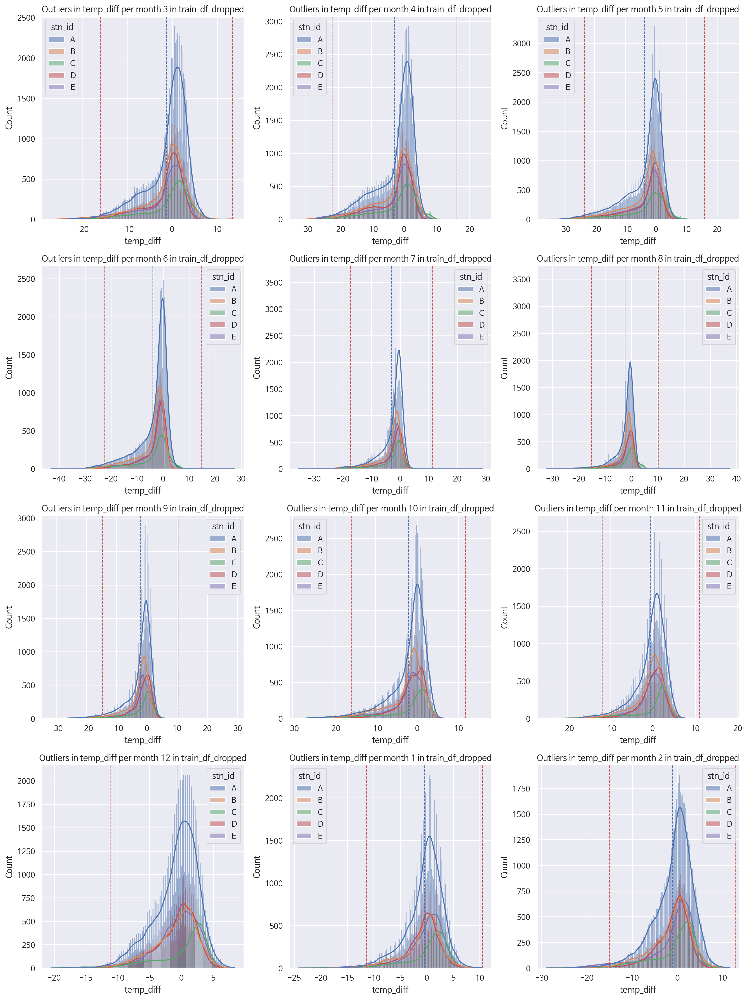

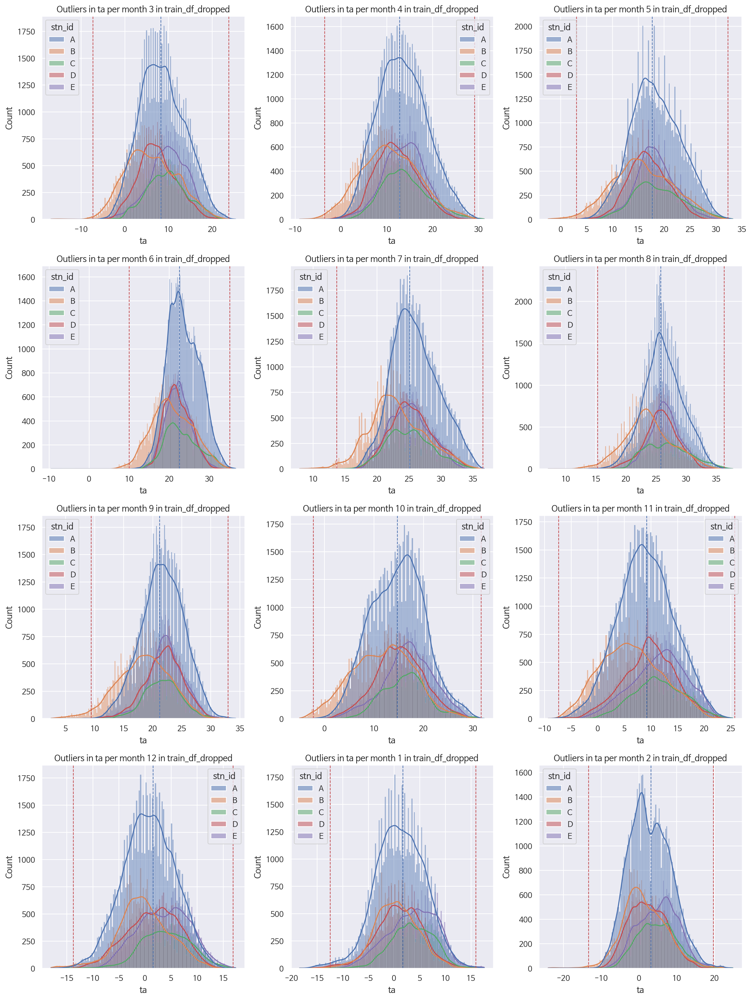

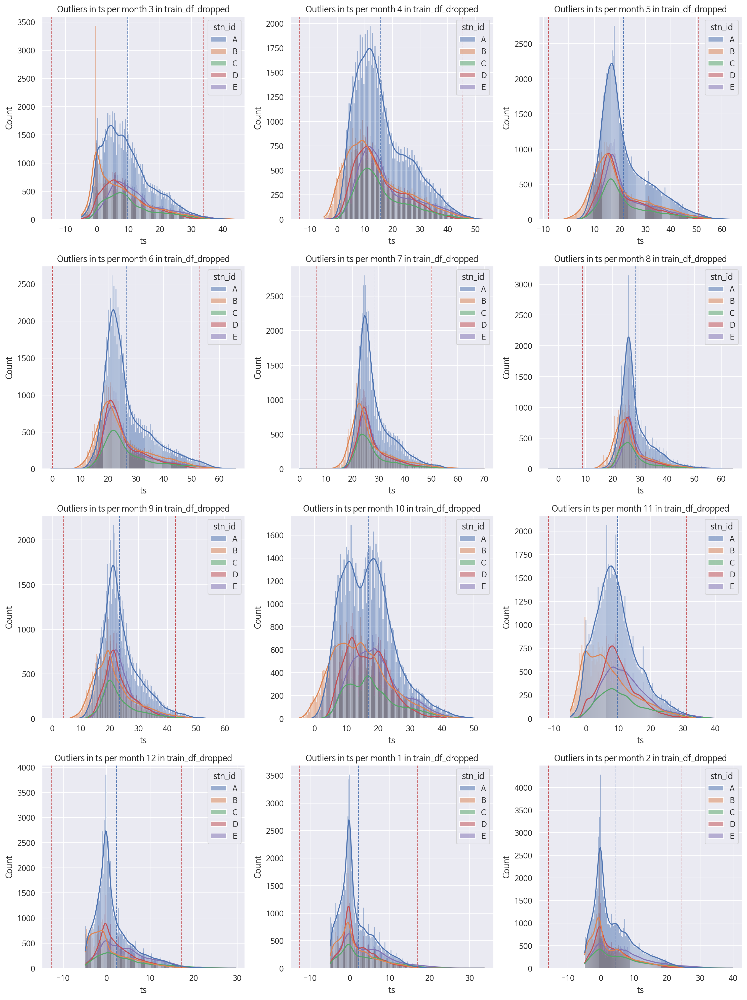

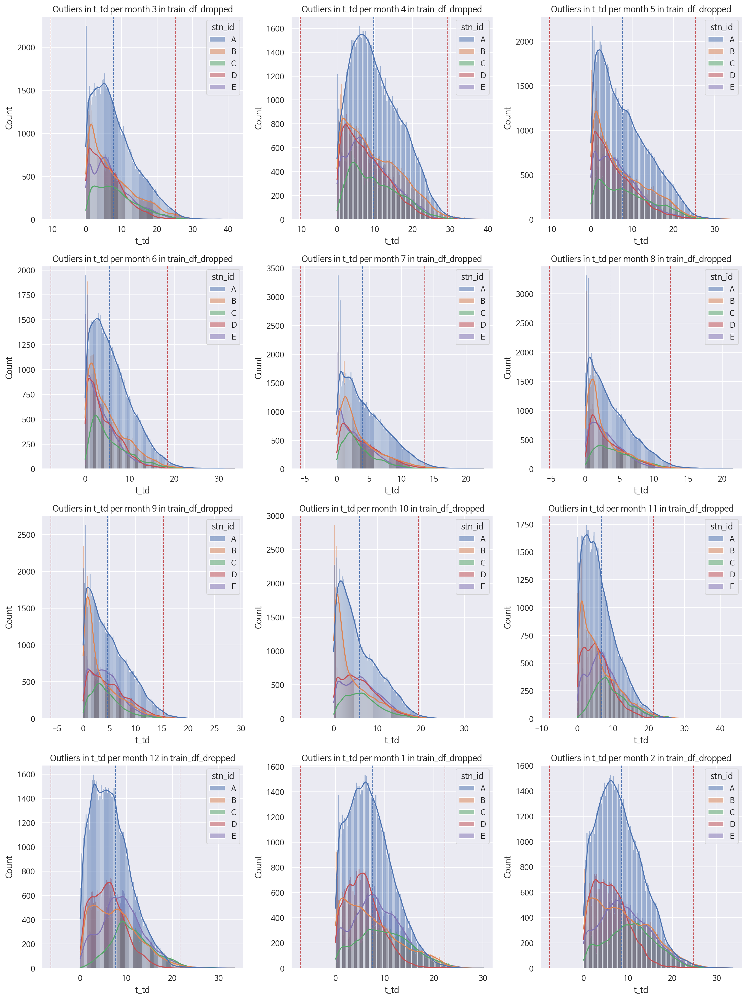

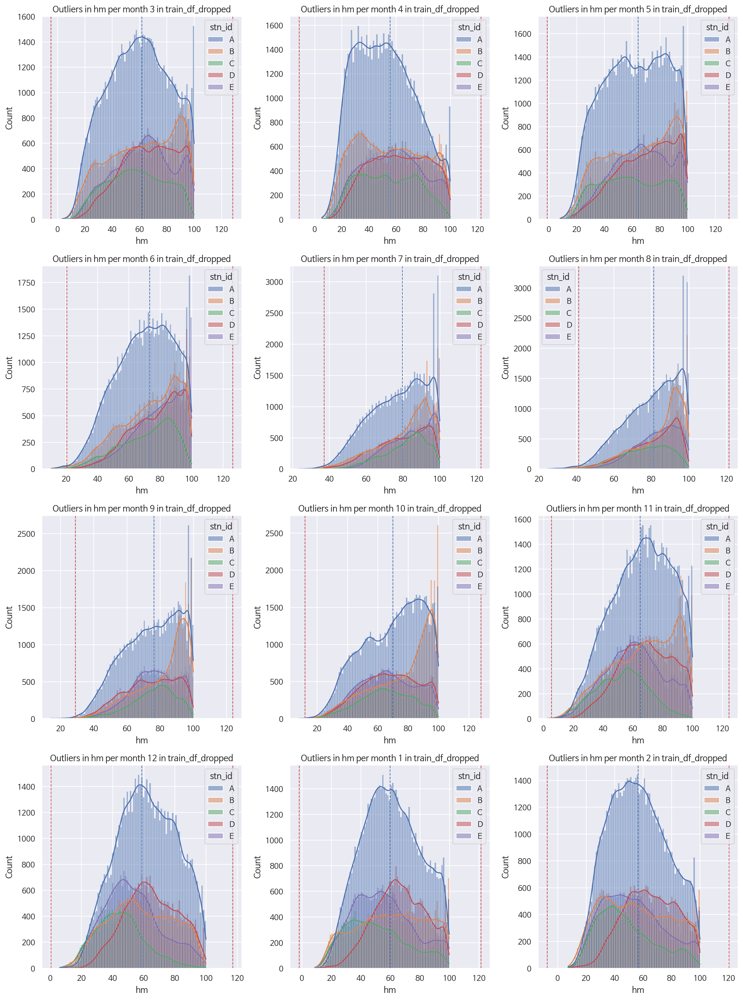

In [94]:
col_list = ["temp_diff", "ta", "ts", "t_td", "hm"]
for col in col_list:
    outliers_check_monthly(train_df_dropped, "train_df_dropped", col)

# outliers_check_monthly(train_df_dropped, "train_df_dropped", "temp_diff")
# outliers_check_monthly(train_df_dropped, "train_df_dropped", "ta")
# outliers_check_monthly(train_df_dropped, "train_df_dropped", "ts")
# outliers_check_monthly(train_df_dropped, "train_df_dropped", "t_td")
# outliers_check_monthly(train_df_dropped, "train_df_dropped", "hm")

### 4-2. 이상치 Capping

In [45]:
def detect_and_replace_outliers(df, columns, threshold=3):

    df_copy = df.copy()

    for column in columns:
        # 월별로 groupby 후, 평균 및 표준편차 계산
        stats = df_copy.groupby('month')[column].agg(['mean', 'std'])
        stats['lower_bound'] = stats['mean'] - threshold * stats['std']
        stats['upper_bound'] = stats['mean'] + threshold * stats['std']

        # df_copy 데이터프레임에 stats 데이터프레임을 merge
        df_copy = df_copy.merge(stats[['lower_bound', 'upper_bound']], left_on='month', right_index=True)

        # 범위를 벗어나는 값들을 대체한다
        df_copy[column] = df_copy.apply(
            lambda row: max(row['lower_bound'], min(row['upper_bound'], row[column])), axis=1
        )

        # lower_bound, upper_bound 컬럼 제거
        df_copy.drop(columns=['lower_bound', 'upper_bound'], inplace=True)

    return df_copy

In [29]:
def detect_and_replace_outliers_month_stn(df, columns, threshold=3):
    df_copy = df.copy()

    for column in columns:
        # month 및 stn_id 별로 groupby 후, 평균 및 표준편차 계산
        stats = df_copy.groupby(['month', 'stn_id'])[column].agg(['mean', 'std'])
        stats['lower_bound'] = stats['mean'] - threshold * stats['std']
        stats['upper_bound'] = stats['mean'] + threshold * stats['std']

        # df_copy 데이터프레임에 stats 데이터프레임을 merge
        df_copy = df_copy.merge(stats[['lower_bound', 'upper_bound']], left_on=['month', 'stn_id'], right_index=True)

        # 범위를 벗어나는 값들을 대체한다
        df_copy[column] = df_copy.apply(
            lambda row: max(row['lower_bound'], min(row['upper_bound'], row[column])), axis=1
        )

        # lower_bound, upper_bound 컬럼 제거
        df_copy.drop(columns=['lower_bound', 'upper_bound'], inplace=True)

    return df_copy


In [46]:
train_df_dropped_no_outliers_std = detect_and_replace_outliers(train_df_dropped, ["temp_diff", "ta", "ts"])
val_df_dropped_no_outliers_std = detect_and_replace_outliers(val_df_dropped, ["temp_diff", "ta", "ts"])
test_df_dropped_no_outliers_std = detect_and_replace_outliers(test_df_dropped, ["temp_diff", "ta", "ts"])

In [30]:
train_df_dropped_no_outliers_month_stn_std = detect_and_replace_outliers_month_stn(train_df_dropped, ["temp_diff", "ta", "ts"])
val_df_dropped_no_outliers_month_stn_std = detect_and_replace_outliers_month_stn(val_df_dropped, ["temp_diff", "ta", "ts"])
test_df_dropped_no_outliers_month_stn_std = detect_and_replace_outliers_month_stn(test_df_dropped, ["temp_diff", "ta", "ts"])

In [34]:
train_df_dropped_no_outliers_month_stn_std

,year,month,day,time,minute,stn_id,ws10_deg,ws10_ms,ta,re,hm,sun10,ts,vis1,class,is_fog,dew_point,dew_reached,temp_diff,ws10_dir,t_td
1593146,J,4,4,15,40,B,112.4,2.2,10.3,0,59.3,0.14,13.8,20000,4,0,2.959540,0,-3.5,E,7.340460
543067,I,4,21,9,0,B,273.6,4.8,10.1,0,54.4,0.31,18.3,20000,4,0,1.603905,0,-8.2,W,8.496095
855552,I,3,26,10,50,D,158.2,3.1,18.1,0,47.0,0.22,20.1,50100,4,0,6.970513,0,-2.0,S,11.129487
2448696,K,7,14,23,30,A,238.0,0.9,24.0,0,81.8,0.00,24.3,15733,4,0,20.795661,0,-0.3,SW,3.204339
2950112,K,1,28,0,50,D,303.7,1.0,-3.8,0,81.6,0.00,-3.0,29900,4,0,-6.385478,0,-0.8,NW,2.585478
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
61866,I,3,4,15,20,A,291.9,4.7,3.7,0,50.9,0.06,9.2,10094,4,0,-5.211826,0,-5.5,W,8.911826
1171997,J,3,31,0,10,A,120.0,1.2,10.4,0,64.0,0.00,7.2,20000,4,0,4.098276,0,3.2,SE,6.301724
770833,I,8,17,2,40,D,239.4,3.4,25.4,0,92.7,0.00,25.3,4166,4,0,24.168285,0,0.1,SW,1.231715
256588,I,11,13,21,30,A,184.6,0.7,11.4,0,83.4,0.00,5.5,4350,4,0,8.775833,1,5.9,S,2.624167


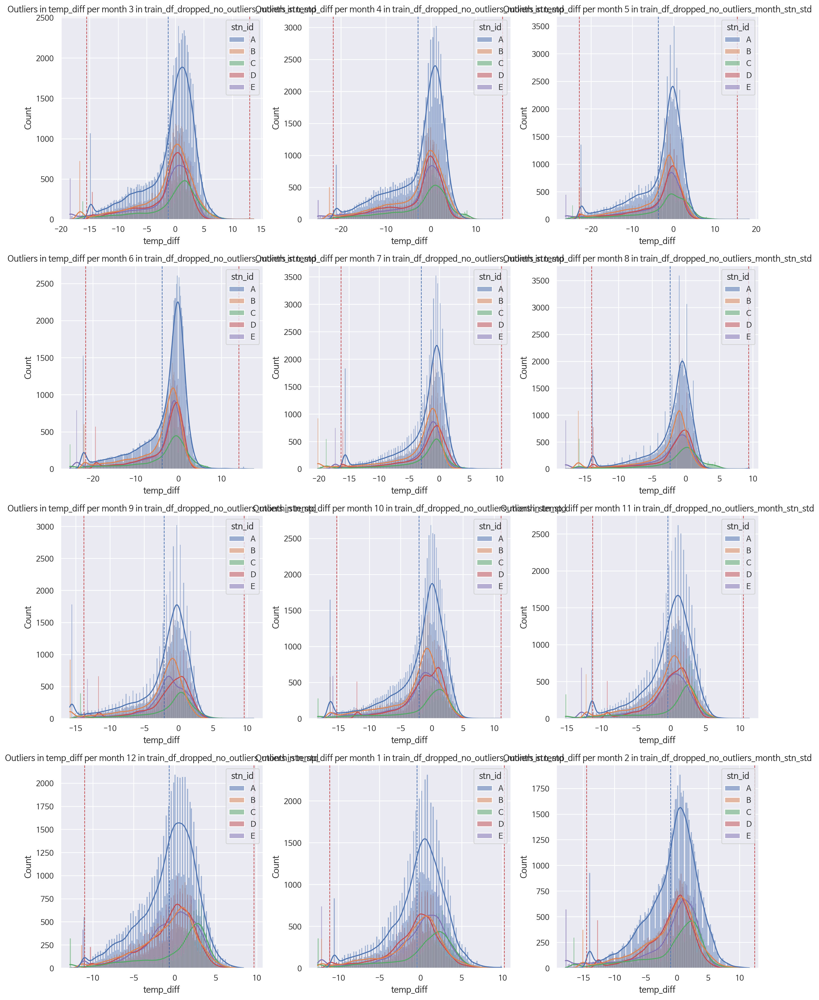

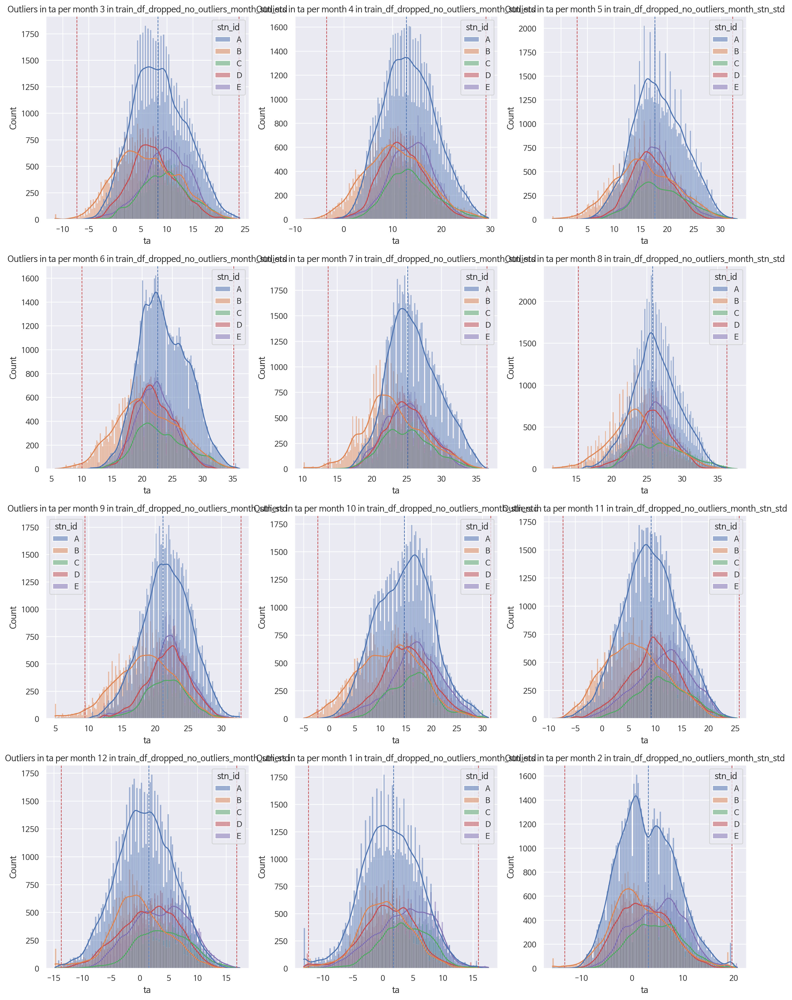

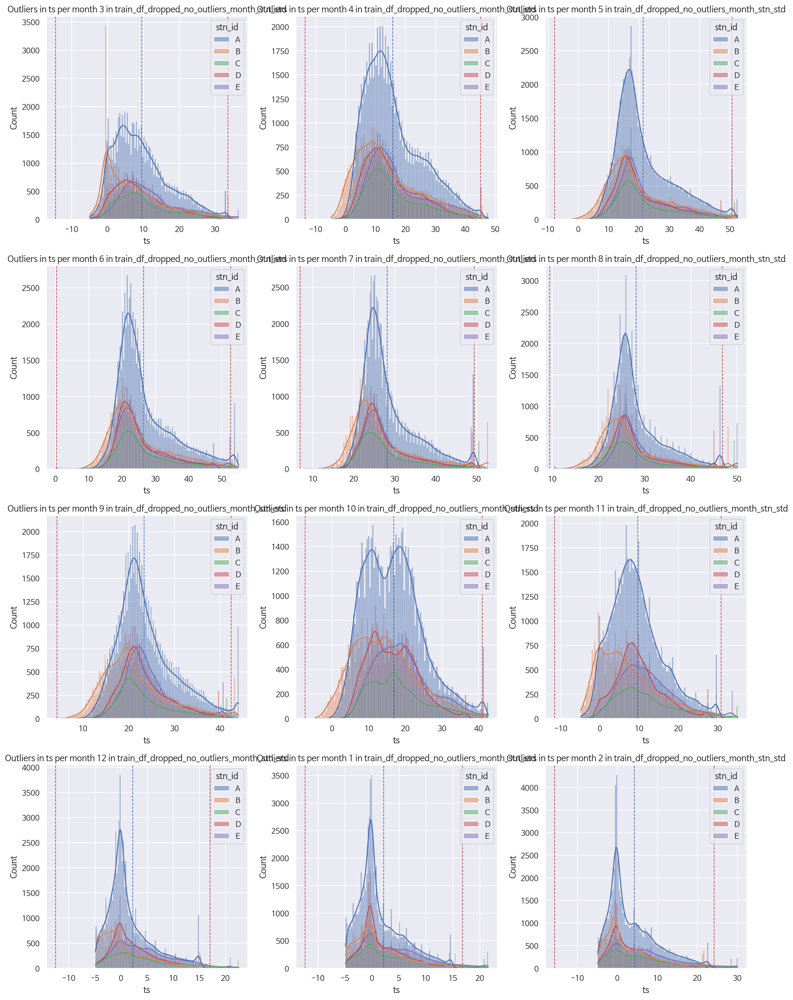

In [35]:
col_list = ["temp_diff", "ta", "ts"]
for col in col_list:
    outliers_check_monthly(train_df_dropped_no_outliers_month_stn_std, "train_df_dropped_no_outliers_month_stn_std", col)

### 4-3. 상관관계 확인

In [36]:
train_df_dropped_no_outliers_month_stn_std.info(show_counts=True)

<class 'pandas.core.frame.DataFrame'>
Index: 2246157 entries, 1593146 to 565557
Data columns (total 21 columns):
 #   Column       Non-Null Count    Dtype   
---  ------       --------------    -----   
 0   year         2246157 non-null  category
 1   month        2246157 non-null  category
 2   day          2246157 non-null  category
 3   time         2246157 non-null  category
 4   minute       2246157 non-null  int64   
 5   stn_id       2246157 non-null  object  
 6   ws10_deg     2246157 non-null  float64 
 7   ws10_ms      2246157 non-null  float64 
 8   ta           2246157 non-null  float64 
 9   re           2246157 non-null  category
 10  hm           2246157 non-null  float64 
 11  sun10        2246157 non-null  float64 
 12  ts           2246157 non-null  float64 
 13  vis1         2246157 non-null  int64   
 14  class        2246157 non-null  category
 15  is_fog       2246157 non-null  category
 16  dew_point    2246157 non-null  float64 
 17  dew_reached  2246157 non-nu

In [37]:
# train_dropped_no_outlier_df_iqr (독립변수 결측치 중간 제거)만 확인
num_cols = train_df_dropped_no_outliers_month_stn_std.describe().columns
train_df_corr_dropped_std = train_df_dropped_no_outliers_month_stn_std[num_cols.to_list() + ["month", "day", "time"]].corr()

train_df_corr_dropped_std.style.background_gradient()

,minute,ws10_deg,ws10_ms,ta,hm,sun10,ts,vis1,dew_point,temp_diff,t_td,month,day,time
minute,1.000000,-0.000591,-0.000629,0.000412,0.000699,-0.000710,0.000013,-0.000782,0.000694,0.000799,-0.000728,-0.000270,0.000653,-0.001051
ws10_deg,-0.000591,1.000000,0.200261,-0.068644,-0.225372,0.086514,-0.045154,0.030109,-0.159785,-0.025354,0.217090,-0.047350,-0.021332,0.084202
ws10_ms,-0.000629,0.200261,1.000000,0.010765,-0.292946,0.219063,0.072552,0.144229,-0.119754,-0.156473,0.280135,-0.075567,-0.014397,0.122593
ta,0.000412,-0.068644,0.010765,1.000000,0.142150,0.272921,0.918047,0.074939,0.887456,-0.267126,-0.037762,0.200604,0.014118,0.114694
hm,0.000699,-0.225372,-0.292946,0.142150,1.000000,-0.430559,0.009737,-0.344055,0.572890,0.255542,-0.974036,0.164977,0.019315,-0.241330
sun10,-0.000710,0.086514,0.219063,0.272921,-0.430559,1.000000,0.549053,0.165239,0.023379,-0.801082,0.464110,-0.053972,-0.000569,0.057530
ts,0.000013,-0.045154,0.072552,0.918047,0.009737,0.549053,1.000000,0.114587,0.755115,-0.626316,0.094403,0.154810,0.013926,0.110843
vis1,-0.000782,0.030109,0.144229,0.074939,-0.344055,0.165239,0.114587,1.000000,-0.085078,-0.131251,0.325656,0.091918,0.007307,0.104266
dew_point,0.000694,-0.159785,-0.119754,0.887456,0.572890,0.023379,0.755115,-0.085078,1.000000,-0.092059,-0.494033,0.246884,0.021422,-0.011339
temp_diff,0.000799,-0.025354,-0.156473,-0.267126,0.255542,-0.801082,-0.626316,-0.131251,-0.092059,1.000000,-0.303770,0.019194,-0.006226,-0.044152


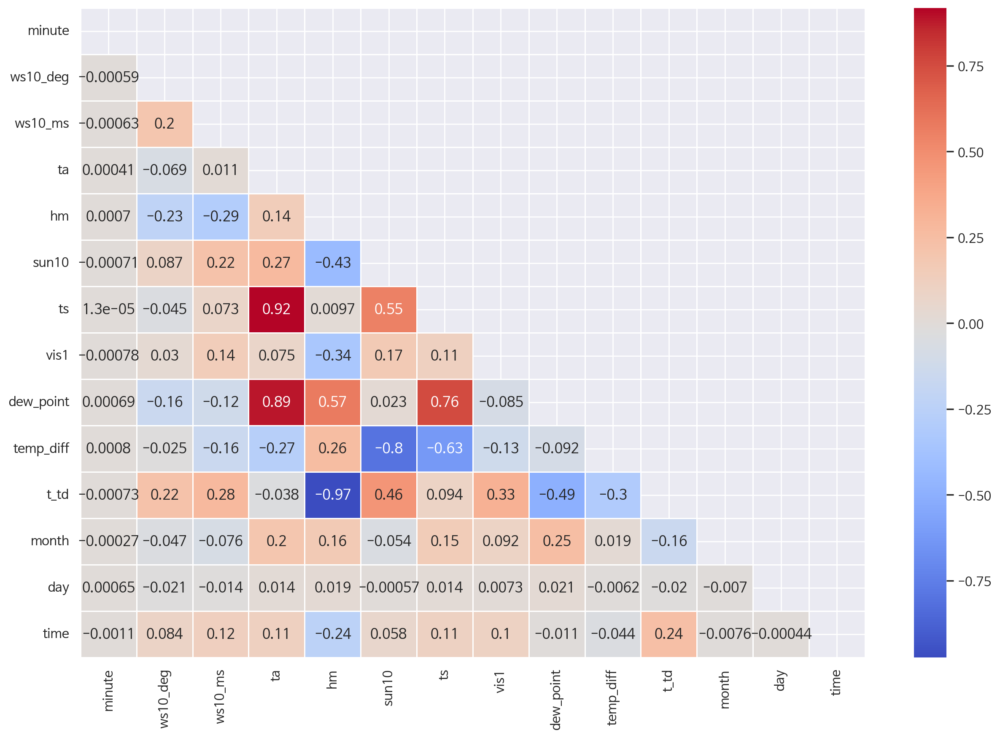

In [38]:
plt.figure(figsize=(15,10))

# 삼각형 마스크를 만든다(위 쪽 삼각형에 True, 아래 삼각형에 False)
mask = np.zeros_like(train_df_corr_dropped_std, dtype=bool)
mask[np.triu_indices_from(mask)] = True

sns.heatmap(train_df_corr_dropped_std,
            annot=True,         # 실제 값을 표시한다
            mask=mask,          # 표시하지 않을 마스크 부분을 지정한다
            linewidths=.5,      # 경계면 실선으로 구분하기
            cmap='coolwarm')
plt.show()

## 5. 데이터셋 저장

### 5.1 결측치 병합

In [47]:
train_merged_std = pd.concat([train_df_dropped_no_outliers_std, train_nan_df])
train_merged_std.reindex(train_df.index)

,year,month,day,time,minute,stn_id,ws10_deg,ws10_ms,ta,re,hm,sun10,ts,vis1,class,is_fog,dew_point,dew_reached,temp_diff,ws10_dir,t_td
1593146,J,4,4,15,40,B,112.4,2.2,10.3,0,59.3,0.14,13.8,20000,4,0,2.959540,0,-3.5,E,7.340460
2629179,K,12,20,8,0,B,328.9,0.7,-10.0,0,80.8,0.00,NaN,11074,4,0,-12.566190,1,89.9,NW,2.566190
543067,I,4,21,9,0,B,273.6,4.8,10.1,0,54.4,0.31,18.3,20000,4,0,1.603905,0,-8.2,W,8.496095
855552,I,3,26,10,50,D,158.2,3.1,18.1,0,47.0,0.22,20.1,50100,4,0,6.970513,0,-2.0,S,11.129487
2448696,K,7,14,23,30,A,238.0,0.9,24.0,0,81.8,0.00,24.3,15733,4,0,20.795661,0,-0.3,SW,3.204339
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1171997,J,3,31,0,10,A,120.0,1.2,10.4,0,64.0,0.00,7.2,20000,4,0,4.098276,0,3.2,SE,6.301724
770833,I,8,17,2,40,D,239.4,3.4,25.4,0,92.7,0.00,25.3,4166,4,0,24.168285,0,0.1,SW,1.231715
256588,I,11,13,21,30,A,184.6,0.7,11.4,0,83.4,0.00,5.5,4350,4,0,8.775833,1,5.9,S,2.624167
565557,I,9,24,13,20,B,80.4,1.9,22.1,0,63.1,0.25,29.5,20000,4,0,14.976106,0,-7.4,E,7.123894


In [48]:
val_merged_std = pd.concat([val_df_dropped_no_outliers_std, val_nan_df])
val_merged_std.reindex(val_df.index)

,year,month,day,time,minute,stn_id,ws10_deg,ws10_ms,ta,re,hm,sun10,ts,vis1,class,is_fog,dew_point,dew_reached,temp_diff,ws10_dir,t_td
536153,I,3,4,8,40,B,283.0,3.1,4.2,0,63.9,0.08,5.7,8888,4,0,-1.810578,0,-1.5,W,6.010578
744508,I,2,16,7,10,D,305.7,5.0,-0.1,0,93.5,0.00,0.2,4687,4,0,-0.988863,0,-0.3,NW,0.888863
331359,I,4,15,3,40,A,68.9,0.1,6.7,0,46.2,0.00,4.2,15715,4,0,-3.687619,0,2.5,E,10.387619
2338662,K,6,10,20,30,A,219.0,2.8,22.7,0,58.5,0.00,20.7,20000,4,0,14.404647,0,2.0,SW,8.295353
2230563,K,5,21,4,0,A,295.2,2.3,19.2,0,67.0,0.00,15.8,19866,4,0,13.119748,0,3.4,NW,6.080252
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1281556,J,4,30,20,0,A,323.9,2.0,11.6,0,72.9,0.00,16.0,15550,4,0,7.059172,0,-4.4,NW,4.540828
2485079,K,3,24,15,20,A,243.1,1.0,14.4,0,45.5,0.20,18.4,8271,4,0,3.144198,0,-4.0,SW,11.255802
301590,I,9,21,10,0,A,77.1,0.6,19.3,0,69.9,0.24,25.1,20000,4,0,13.844976,0,-5.8,E,5.455024
2926057,K,8,13,23,40,D,167.8,3.8,27.4,0,89.6,0.00,26.8,18035,4,0,25.591937,0,0.6,S,1.808063


In [49]:
# test_df 원본의 index 순서를 유지하면서 합친다
test_merged_std = pd.concat([test_df_dropped_no_outliers_std, test_nan_df]).sort_index()

In [39]:
# 월별, stn_id별 이상치 capping한 데이터셋 concat
train_merged_month_stn_std = pd.concat([train_df_dropped_no_outliers_month_stn_std, train_nan_df])
train_merged_month_stn_std.reindex(train_df.index)

,year,month,day,time,minute,stn_id,ws10_deg,ws10_ms,ta,re,hm,sun10,ts,vis1,class,is_fog,dew_point,dew_reached,temp_diff,ws10_dir,t_td
1593146,J,4,4,15,40,B,112.4,2.2,10.3,0,59.3,0.14,13.8,20000,4,0,2.959540,0,-3.5,E,7.340460
2629179,K,12,20,8,0,B,328.9,0.7,-10.0,0,80.8,0.00,NaN,11074,4,0,-12.566190,1,89.9,NW,2.566190
543067,I,4,21,9,0,B,273.6,4.8,10.1,0,54.4,0.31,18.3,20000,4,0,1.603905,0,-8.2,W,8.496095
855552,I,3,26,10,50,D,158.2,3.1,18.1,0,47.0,0.22,20.1,50100,4,0,6.970513,0,-2.0,S,11.129487
2448696,K,7,14,23,30,A,238.0,0.9,24.0,0,81.8,0.00,24.3,15733,4,0,20.795661,0,-0.3,SW,3.204339
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1171997,J,3,31,0,10,A,120.0,1.2,10.4,0,64.0,0.00,7.2,20000,4,0,4.098276,0,3.2,SE,6.301724
770833,I,8,17,2,40,D,239.4,3.4,25.4,0,92.7,0.00,25.3,4166,4,0,24.168285,0,0.1,SW,1.231715
256588,I,11,13,21,30,A,184.6,0.7,11.4,0,83.4,0.00,5.5,4350,4,0,8.775833,1,5.9,S,2.624167
565557,I,9,24,13,20,B,80.4,1.9,22.1,0,63.1,0.25,29.5,20000,4,0,14.976106,0,-7.4,E,7.123894


In [40]:
val_merged_month_stn_std = pd.concat([val_df_dropped_no_outliers_month_stn_std, val_nan_df])
val_merged_month_stn_std.reindex(val_df.index)

,year,month,day,time,minute,stn_id,ws10_deg,ws10_ms,ta,re,hm,sun10,ts,vis1,class,is_fog,dew_point,dew_reached,temp_diff,ws10_dir,t_td
536153,I,3,4,8,40,B,283.0,3.1,4.2,0,63.9,0.08,5.7,8888,4,0,-1.810578,0,-1.5,W,6.010578
744508,I,2,16,7,10,D,305.7,5.0,-0.1,0,93.5,0.00,0.2,4687,4,0,-0.988863,0,-0.3,NW,0.888863
331359,I,4,15,3,40,A,68.9,0.1,6.7,0,46.2,0.00,4.2,15715,4,0,-3.687619,0,2.5,E,10.387619
2338662,K,6,10,20,30,A,219.0,2.8,22.7,0,58.5,0.00,20.7,20000,4,0,14.404647,0,2.0,SW,8.295353
2230563,K,5,21,4,0,A,295.2,2.3,19.2,0,67.0,0.00,15.8,19866,4,0,13.119748,0,3.4,NW,6.080252
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1281556,J,4,30,20,0,A,323.9,2.0,11.6,0,72.9,0.00,16.0,15550,4,0,7.059172,0,-4.4,NW,4.540828
2485079,K,3,24,15,20,A,243.1,1.0,14.4,0,45.5,0.20,18.4,8271,4,0,3.144198,0,-4.0,SW,11.255802
301590,I,9,21,10,0,A,77.1,0.6,19.3,0,69.9,0.24,25.1,20000,4,0,13.844976,0,-5.8,E,5.455024
2926057,K,8,13,23,40,D,167.8,3.8,27.4,0,89.6,0.00,26.8,18035,4,0,25.591937,0,0.6,S,1.808063


In [41]:
tes_merged_month_stn_std = pd.concat([test_df_dropped_no_outliers_month_stn_std, test_nan_df]).sort_index()

### 5.2 저장 경로 설정

In [42]:
# 전처리 마친 데이터셋 저장할 경로 설정하는 함수

def save_local_path(name):
        
    # 작업 디렉토리 origin_dir에 선언
    origin_dir = os.getcwd()

    # ".." : 상위 디렉토리로 이동
    os.chdir("..")

    # 전처리 거친 데이터셋 저장할 이름 지정
    save_name_train = "fog_train_" + name + ".csv"
    save_name_val = "fog_val_" + name + ".csv"
    save_name_test = "fog_test_" + name + ".csv"

    # 전처리 거친 데이터셋 저장 경로 설정
    train_save_path = os.path.join(os.getcwd(), "fog_data", save_name_train)
    val_save_path = os.path.join(os.getcwd(), "fog_data", save_name_val)
    test_save_path = os.path.join(os.getcwd(), "fog_data", save_name_test)
    
    # 운영체제가 윈도우일 경우, "\\"를 "/"로 바꿔줘야 한다
    if os.name == "nt":
        train_save_path = train_save_path.replace("\\", "/")
        val_save_path = val_save_path.replace("\\", "/")
        test_save_path = test_save_path.replace("\\", "/")

    # # origin_dir로 경로 다시 변경 (초기화)
    os.chdir(origin_dir)

    return train_save_path, val_save_path, test_save_path

In [193]:
# def save_colab_path(train_df, test_df):
#     origin_dir = os.getcwd()

#     # 전처리 거친 데이터셋 저장할 이름 지정
#     save_name_train = "fog_train_modified.csv"
#     save_name_test = "fog_test_modified.csv"

#     # 전처리 거친 데이터셋 저장 경로 설정
#     train_save_path = os.path.join(train_path[:48], save_name_train)
#     test_save_path = os.path.join(test_path[:48], save_name_test)
    
#     return train_save_path, test_save_path

In [50]:
# 데이터셋 저장 경로 함수 적용 후 확인
train_save_path, val_save_path, test_save_path = save_local_path("merged_std")
# train_save_path, val_save_path, test_save_path = save_local_path("merged_month_stn_std")

print(train_save_path)
print(val_save_path)
print(test_save_path)

c:/Users/aryij/Documents/DataStudy/fog_data/fog_train_merged_std.csv
c:/Users/aryij/Documents/DataStudy/fog_data/fog_val_merged_std.csv
c:/Users/aryij/Documents/DataStudy/fog_data/fog_test_merged_std.csv


In [51]:
# 전처리 마친 데이터셋 저장
train_merged_month_stn_std.to_csv(train_save_path, index=False, encoding="utf-8")
val_merged_month_stn_std.to_csv(val_save_path, index=False, encoding="utf-8")
tes_merged_month_stn_std.to_csv(test_save_path, index=False, encoding="utf-8")